 **Rumour detection using LSTM Deep Learning**

*Library Imports*

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
import tensorflow as tf
from wordcloud import WordCloud


In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

In [ ]:
print(tf.__version__)

2.12.0


In [ ]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

##wordcloud

In [ ]:
text=' '.join(fake['text'].tolist())

<function matplotlib.pyplot.show(close=None, block=None)>

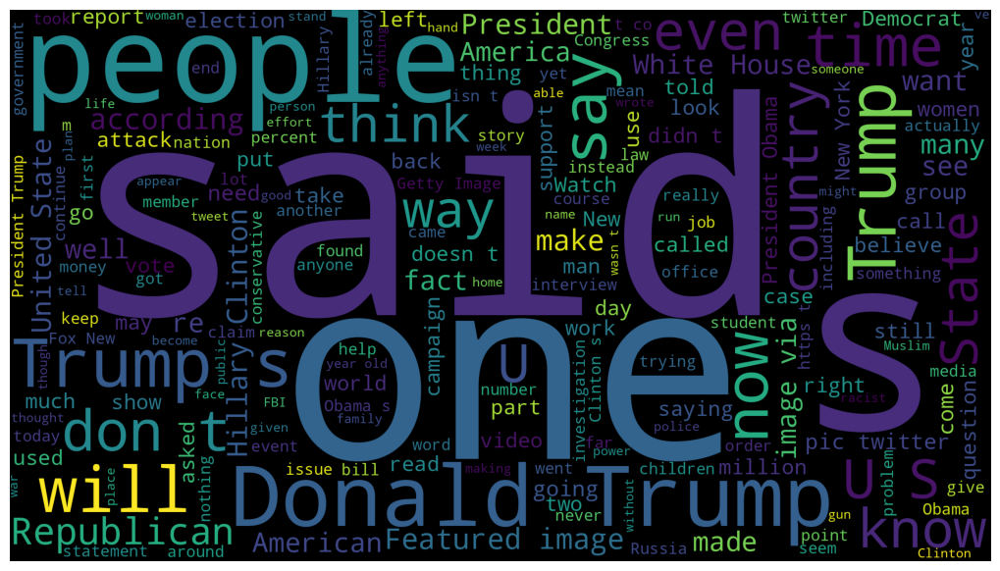

In [ ]:
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show


##Real News

In [ ]:
real=pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [ ]:
text=' '.join(real['text'].tolist())

<function matplotlib.pyplot.show(close=None, block=None)>

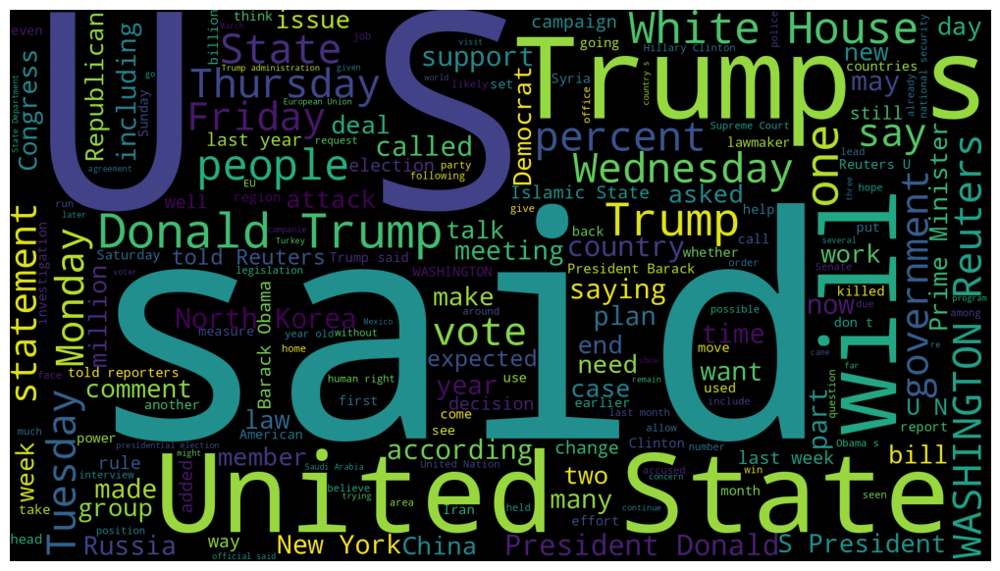

In [ ]:
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

# Difference in real and fake news data
Real news seems to have source of publication which is not present in fake news set
Looking at the data:


*   Most of the text contains reuters information such as **"WASHINGTON(Reuters)"**
*   Some texts are tweets from twitter
*   Few text do not contain any publication info



# Data Cleaning Process
Removing reuters information or twitter twit information from the text
*    Text can be splitted only once at "-" which is always present after mentioning source of publication, this gives us publication part and text part.
*    If we do not get text part, this means publication details wasn't given for that record.
*    The twitter tweets always have some source, a long text of max 259 characters.

In [ ]:
real.sample(5)

,title,text,subject,date
651,House speaker: May need a temporary bill to fu...,WASHINGTON (Reuters) - U.S. lawmakers may have...,politicsNews,"November 14, 2017"
18402,Trump says Puerto Rico has thrown budget 'out ...,WASHINGTON (Reuters) - U.S. President Donald T...,worldnews,"October 3, 2017"
17074,United Arab Emirates says to announce governme...,DUBAI (Reuters) - Sheikh Mohammed bin Rashid A...,worldnews,"October 19, 2017"
9674,Trump signals willingness to raise U.S. minimu...,(This version of the story corrects the figur...,politicsNews,"May 4, 2016"
8926,New rules give protesters more leeway at Repub...,CLEVELAND (Reuters) - A federal judge on Wedne...,politicsNews,"June 29, 2016"


In [ ]:
unknown_publishers=[]
for index,row in enumerate(real.text.values):
  try:
    record=row.split('-',maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [ ]:
len(unknown_publishers)

222

In [ ]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
real=real.drop(8970,axis=0)

In [ ]:
publisher=[]
temp_text=[]


In [ ]:
for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    temp_text.append(row)
    publisher.append('Unknown')
  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    temp_text.append(record[1].strip())


In [ ]:
real['publisher']=publisher
real['text']=temp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21416, 5)

In [ ]:
empty_fake_index=[index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text']=real['title']+" "+real['text']
fake['text']=fake['title']+" "+fake['text']

In [ ]:
real['text']=real['text'].apply(lambda x:str(x).lower())
fake['text']=fake['text'].apply(lambda x:str(x).lower())

##Preprocessing of Data

In [ ]:
real['class']=1
fake['class']=0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
real=real[['text','class']]

In [ ]:
fake=fake[['text','class']]

In [ ]:
data=real.append(fake,ignore_index=True)

<ipython-input-32-f4a6de377243>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  data=real.append(fake,ignore_index=True)


In [ ]:
data.sample(5)

,text,class
27480,fox news host makes herself a total laughings...,0
42137,clueless anti-trump protesters asked why they ...,0
22194,trump administration gets ready to come after...,0
33865,breaking: historic white house meeting between...,0
15877,niger defense minister asks u.s. to deploy arm...,1


In [ ]:
#To remove speacial characters from text data

!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 45.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Getting requirements to build wheel ... error
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.
2023-05-31 16:43:42.668275: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import preprocess_kgptalkie as ps


In [ ]:
data['text']=data['text'].apply(lambda x: ps.remove_special_chars(x))
data['text'] = [str (item) for item in data['text']]

In [ ]:
data.head();

In [ ]:
#Vectorization--word2vec

In [ ]:
import gensim

In [ ]:
y=data['class'].values

In [ ]:
X=[d.split() for d in data['text'].tolist()]


In [ ]:
type(X[0])

list

In [ ]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

In [ ]:
DIM=100
w2v_model=gensim.models.Word2Vec(sentences=X,vector_size=DIM,window=10,min_count=1)
w2v_model.save('word2vec_model.bin')

In [ ]:
w2v_model.wv.key_to_index

{'the': 0,
 'to': 1,
 'of': 2,
 'a': 3,
 'and': 4,
 'in': 5,
 'that': 6,
 'on': 7,
 'for': 8,
 's': 9,
 'is': 10,
 'he': 11,
 'said': 12,
 'trump': 13,
 'it': 14,
 'with': 15,
 'was': 16,
 'as': 17,
 'his': 18,
 'by': 19,
 'has': 20,
 'be': 21,
 'have': 22,
 'not': 23,
 'from': 24,
 'this': 25,
 'at': 26,
 'are': 27,
 'who': 28,
 'us': 29,
 'an': 30,
 'they': 31,
 'i': 32,
 'but': 33,
 'we': 34,
 'would': 35,
 'president': 36,
 'about': 37,
 'will': 38,
 'their': 39,
 'had': 40,
 'you': 41,
 't': 42,
 'been': 43,
 'were': 44,
 'people': 45,
 'more': 46,
 'or': 47,
 'after': 48,
 'which': 49,
 'she': 50,
 'her': 51,
 'one': 52,
 'if': 53,
 'its': 54,
 'out': 55,
 'all': 56,
 'what': 57,
 'state': 58,
 'when': 59,
 'new': 60,
 'also': 61,
 'up': 62,
 'there': 63,
 'over': 64,
 'no': 65,
 'house': 66,
 'donald': 67,
 'our': 68,
 'states': 69,
 'clinton': 70,
 'obama': 71,
 'government': 72,
 'can': 73,
 'just': 74,
 'him': 75,
 'so': 76,
 'than': 77,
 'republican': 78,
 'other': 79,
 'som

In [ ]:
w2v_model.wv['looms']

array([-0.9103525 ,  0.23777182, -0.1840686 ,  0.56478953, -1.2533535 ,
       -0.1250422 ,  0.97160584,  0.92751753, -0.39665937, -0.29511446,
       -0.27690184, -0.11321875, -0.16467348, -0.515725  , -0.18123049,
       -0.6862483 ,  0.3509785 ,  0.3691928 , -0.19951317, -0.31080335,
       -0.3225029 ,  0.24269176, -0.0811021 , -0.09036911, -0.30853269,
        0.03210515,  0.23077847,  0.42637733, -0.61156607,  0.04938304,
       -0.42290834,  1.0188228 , -0.09196129,  0.4885214 , -0.23549232,
        0.2941261 , -0.25710818, -0.440382  ,  0.08382376,  0.324881  ,
        0.27368212,  0.13316883, -0.02006106,  0.66080284,  0.0879226 ,
        0.9720732 ,  0.07775741,  0.50428486, -0.00399342, -0.5020636 ,
        0.0144678 , -0.5509495 ,  0.45107648, -0.48417014, -0.59016657,
        0.6450656 ,  0.8818717 ,  0.23262942,  0.604915  , -0.07701212,
       -0.05707055,  0.46608856,  0.29204106, -0.07295687, -0.12924783,
        0.12954791,  0.03557069, -0.2527319 , -0.5691511 ,  0.13

In [ ]:
w2v_model.wv['india']

array([-2.7081330e+00,  2.7084563e+00, -1.1370482e+00,  1.0729327e+00,
       -6.3969381e-02, -9.7123969e-01,  4.7978747e-01,  2.6654391e+00,
       -1.9036477e+00,  1.8939757e+00,  1.1096982e+00, -1.8723053e-01,
       -3.0453682e+00, -9.8083472e-01,  1.5012207e+00,  1.5763487e+00,
        1.0169414e+00, -2.8681129e-01, -2.0457799e+00, -7.1684438e-01,
        2.1405578e+00,  6.8703783e-01,  1.2975295e+00, -5.2423990e-01,
        9.0006191e-01,  1.0515950e+00,  1.3461639e-01,  1.3858626e+00,
       -1.5733132e+00,  1.4437665e+00,  2.7432048e+00, -4.7128570e-01,
       -2.8597715e+00,  1.6795071e+00,  1.3792512e+00,  3.4666162e+00,
       -2.8932710e+00,  2.5163803e+00,  2.1423702e+00,  1.9038584e+00,
        1.2083031e+00, -3.6262124e+00,  1.3867120e+00,  1.5891644e+00,
       -2.2173705e+00, -5.5253029e-01, -4.3167555e-01,  8.4424740e-01,
       -2.0190997e+00, -1.8407260e+00, -9.5962870e-01,  1.2112048e+00,
        2.8281651e+00, -7.0373148e-01,  6.8708014e-01, -1.9245560e+00,
      

In [ ]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.719618558883667),
 ('malaysia', 0.7186435461044312),
 ('australia', 0.6268808841705322),
 ('indian', 0.6161374449729919),
 ('china', 0.6147679090499878),
 ('philippines', 0.6082294583320618),
 ('modi', 0.5998192429542542),
 ('norway', 0.5984000563621521),
 ('indonesia', 0.5959157943725586),
 ('thailand', 0.5947765707969666)]

In [ ]:
w2v_model.wv.most_similar('us')

[('american', 0.5743073225021362),
 ('nato', 0.49932870268821716),
 ('natos', 0.48429733514785767),
 ('iranian', 0.4764409065246582),
 ('1842', 0.45670783519744873),
 ('washingtons', 0.4562845826148987),
 ('countryus', 0.451879620552063),
 ('iran', 0.44822654128074646),
 ('russian', 0.43629640340805054),
 ('rotor', 0.4348818063735962)]

In [ ]:
w2v_model.wv.most_similar('china')

[('beijing', 0.842024564743042),
 ('taiwan', 0.8020424842834473),
 ('chinas', 0.7550586462020874),
 ('chinese', 0.6998335719108582),
 ('pyongyang', 0.670173704624176),
 ('beijings', 0.6492453813552856),
 ('xi', 0.6462206840515137),
 ('japan', 0.633051335811615),
 ('india', 0.6147679090499878),
 ('taipei', 0.608391523361206)]

In [ ]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [ ]:
#tokenizer.word_index

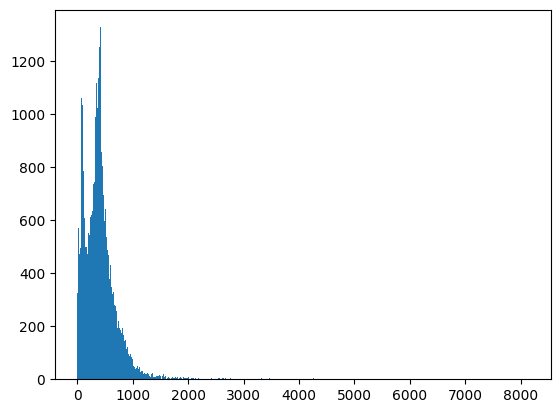

In [ ]:
plt.hist([len(x) for x in X],bins=700)
plt.show()

In [ ]:
nos=np.array([len(x) for x in X])
len(nos[nos>1000])

1581

In [ ]:
maxlen=1000
X=pad_sequences(X,maxlen=maxlen)

In [ ]:
len(X[0])

1000

In [ ]:
vocab_size=len(tokenizer.word_index)+1
vocab=tokenizer.word_index

In [ ]:
def get_weight_matrix(model):
   weight_matrix=np.zeros((vocab_size,DIM))
   for word, i in vocab.items():
     weight_matrix[i]=model.wv[word]
   return weight_matrix

In [ ]:
embedding_vectors=get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

(231873, 100)

In [ ]:
model=Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y)


In [ ]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 35s 37ms/step - loss: 0.1534 - acc: 0.9450 - val_loss: 0.1163 - val_acc: 0.9592
Epoch 2/6
737/737 [==============================] - 27s 36ms/step - loss: 0.0673 - acc: 0.9778 - val_loss: 0.0726 - val_acc: 0.9750
Epoch 3/6
737/737 [==============================] - 27s 36ms/step - loss: 0.0382 - acc: 0.9864 - val_loss: 0.0410 - val_acc: 0.9852
Epoch 4/6
737/737 [==============================] - 28s 38ms/step - loss: 0.0216 - acc: 0.9929 - val_loss: 0.0227 - val_acc: 0.9915
Epoch 5/6
737/737 [==============================] - 26s 36ms/step - loss: 0.0112 - acc: 0.9964 - val_loss: 0.0238 - val_acc: 0.9915
Epoch 6/6
737/737 [==============================] - 27s 37ms/step - loss: 0.0147 - acc: 0.9952 - val_loss: 0.0359 - val_acc: 0.9888


In [ ]:
y_pred=(model.predict(X_test)>=0.5).astype(int)

351/351 [==============================] - 5s 12ms/step


In [ ]:
accuracy_score(y_test,y_pred)

0.9878841870824053

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      5819
           1       0.99      0.98      0.99      5406

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [ ]:
import os

In [ ]:
def get_file_size(file_path):
    size = os.path.getsize(file_path)
    return size

In [ ]:
def convert_bytes(size, unit=None):
    if unit == "KB":
        return print('File size: ' + str(round(size / 1024, 3)) + ' Kilobytes')
    elif unit == "MB":
        return print('File size: ' + str(round(size / (1024 * 1024), 3)) + ' Megabytes')
    else:
        return print('File size: ' + str(size) + ' bytes')

In [ ]:
KERAS_MODEL_NAME = "tf_model_fashion_mnist.h5"

In [ ]:
model.save(KERAS_MODEL_NAME)


In [ ]:
convert_bytes(get_file_size(KERAS_MODEL_NAME), "MB")

File size: 89.826 Megabytes


#TFLite Model

In [ ]:
TF_LITE_MODEL_FILE_NAME = "tf_lite_model.tflite"


tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tf_lite_converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS, tf.lite.OpsSet.SELECT_TF_OPS]
tf_lite_converter._experimental_lower_tensor_list_ops = False

tflite_model = tf_lite_converter.convert()


tflite_model_name = TF_LITE_MODEL_FILE_NAME
open(tflite_model_name, "wb").write(tflite_model)


convert_bytes(get_file_size(TF_LITE_MODEL_FILE_NAME), "KB")

File size: 91045.492 Kilobytes


In [ ]:
#Testing with real life news
x=['If you have COVID and aren’t showing symptoms you won’t transmit the disease']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)


In [ ]:
(model.predict(x)>=0.5).astype(int)

1/1 [==============================] - 0s 28ms/step


array([[0]])

In [ ]:
x=['Five police personnel have been suspended over the murder of gangster-politician Atiq Ahmad and his brother Ashraf while in the custody of the cops late Saturday in Prayagraj in Uttar Pradesh. The suspended police officers include Station House Officer Ashwani Kumar Singh from the city\'s Shahganj Police Station. Of the other four, two hold the rank of Inspector and two Constable.']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)

In [ ]:
(model.predict(x)>=0.5).astype(int)

1/1 [==============================] - 0s 26ms/step


array([[1]])